In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import json
import os
import seaborn as sns
from dataloader import DataLoader
from PIL import Image
from _graphutils import GraphUtils
from _plotutils import PlotUtils
from kernels.wlkernel import WLKernel
from kernels.shortestpathkernel import ShortestPathKernel
from kernels.randomwalkkernel import RandomWalkKernel
from kernels.labelhasher import LabelHasher
from sklearn.manifold import MDS
from sklearn.manifold import TSNE
from sklearn.kernel_ridge import KernelRidge
from sklearn.metrics import mean_absolute_error, root_mean_squared_error
from sklearn.model_selection import LeaveOneOut

In [3]:
dl = DataLoader("../eyelink_data")
imgs = dl.get_example_images()

PLOT = {
    "aois": False,
    "scanpaths": False,
    "clustering": True,
    "matrices": False,
    "graphs": True,
    "kernel": False,
    "tsne": False,
    "mds": True,
    "loocv": False
}

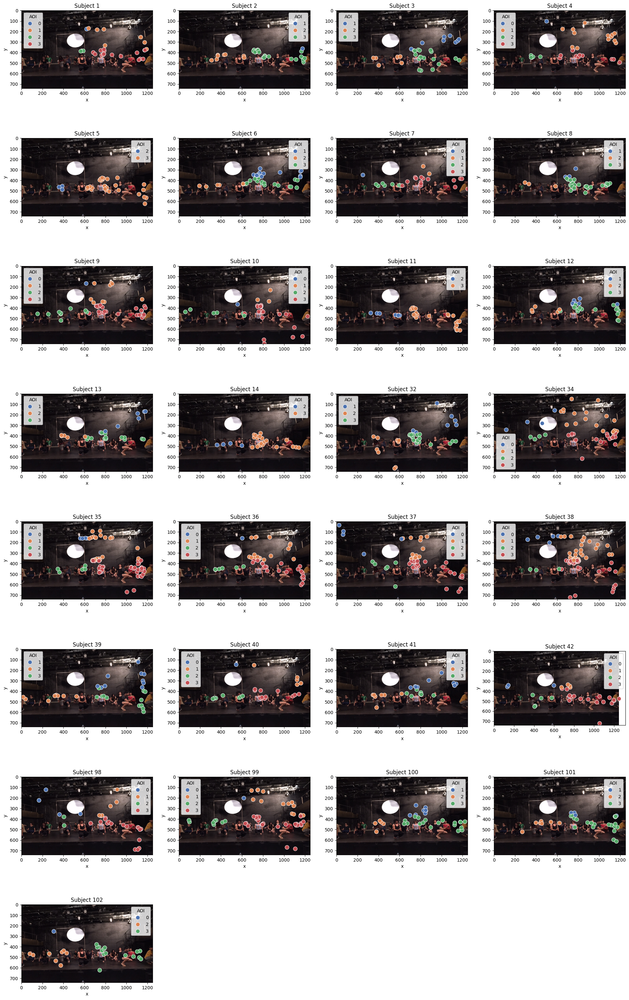

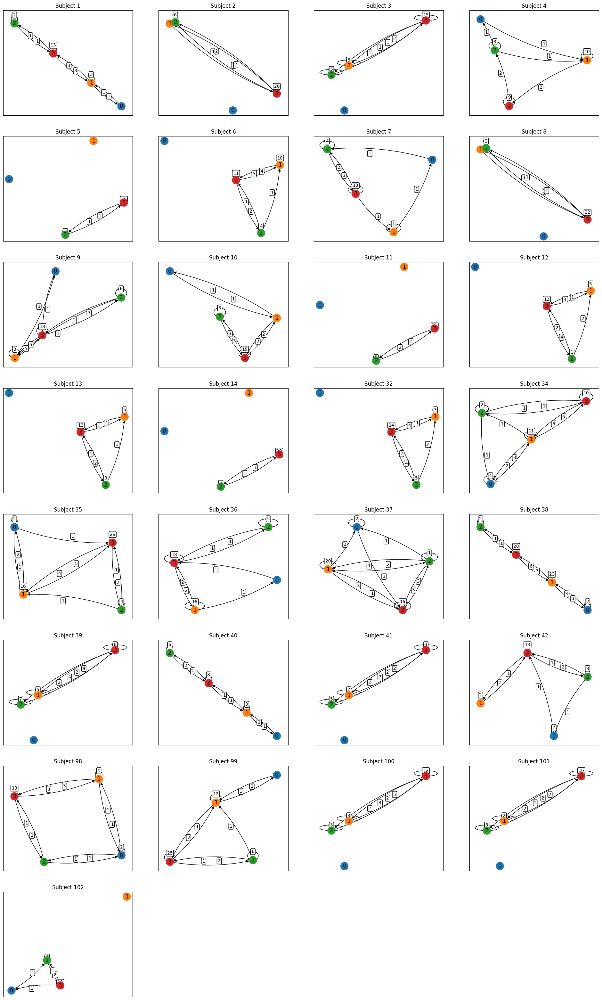

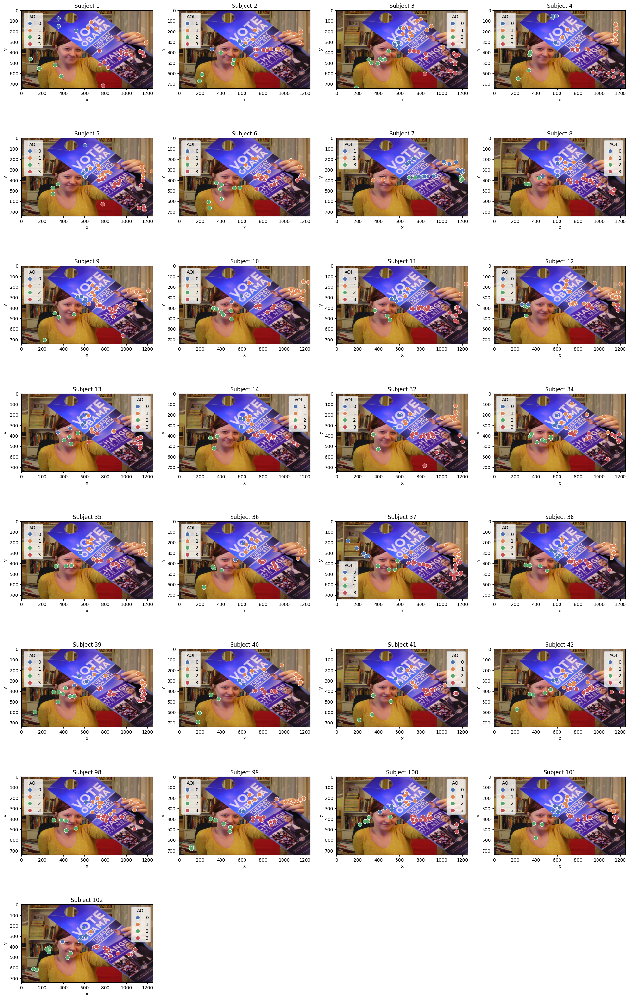

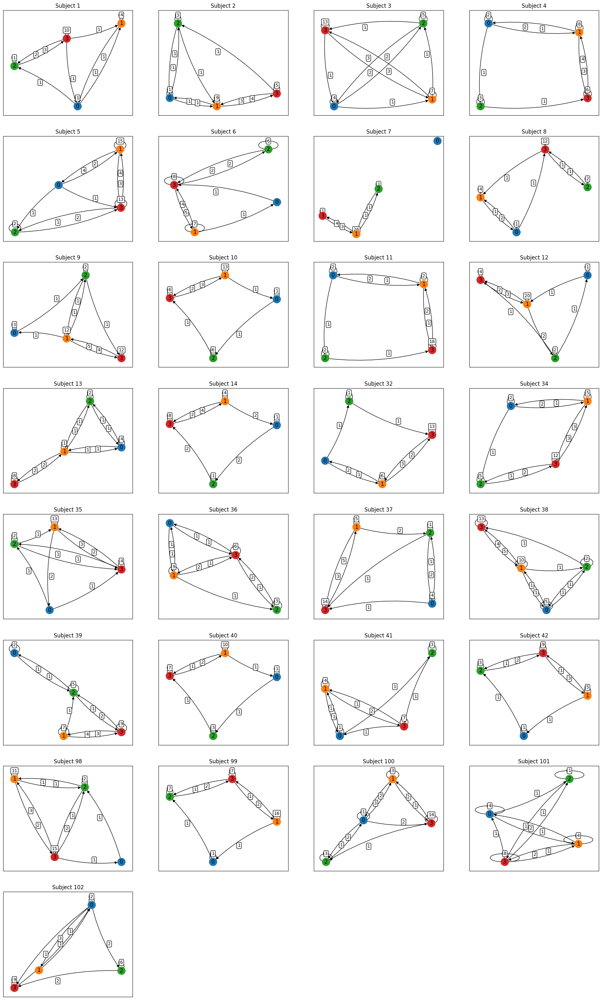

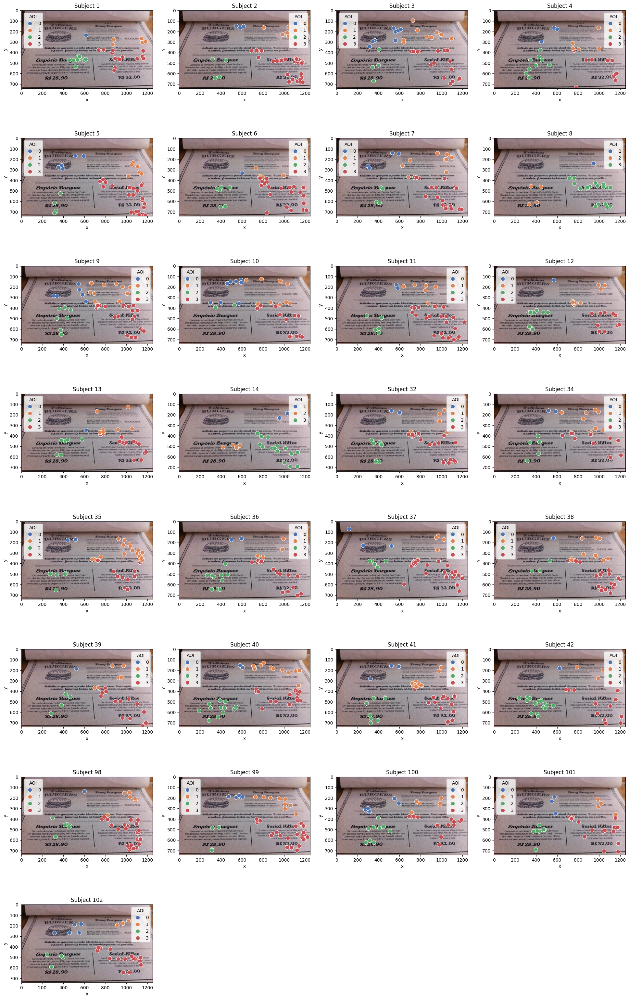

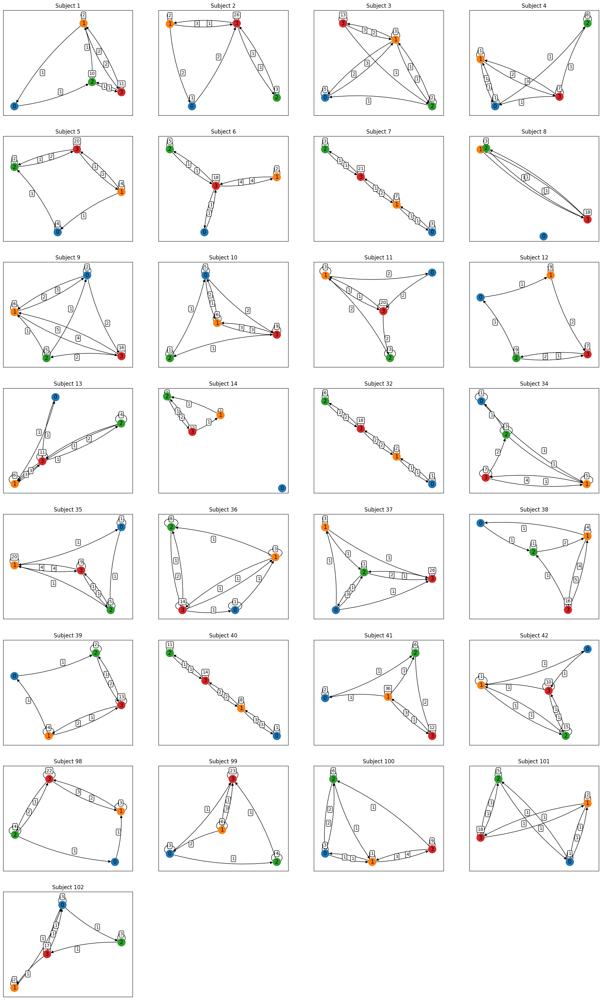

In [4]:
K_entropies = {}

for img in imgs:
    img_file = dl.get_image(img)
    aois = dl.divide_image_aois(img)

    if PLOT["aois"]:
        PlotUtils.plot_aois(aois=aois, title="Original image and predefined AOIs", image=img_file)


    trials = dl.get_image_trials(img)
    trial_numbers = dl.get_image_trials(img, False)
    answer_dfs = dl.get_image_answers(img)
    answers = dl.get_image_ratings(img) # {subject: answer_dfs[subject].query(f"trial == {trial_numbers[subject]}")["response"].item() for subject in trials.keys()}
    if PLOT["scanpaths"]:
        PlotUtils.wrap_dict_plot(trials, n_wrap=3, plotting_function=PlotUtils.trace_plot, title="Subject", image=img_file)


    # MATCHING TO NEAREST AOI 

    trials_clustered = {subject: GraphUtils.cluster_to_aois(trial, aois) for (subject, trial) in trials.items()}


    if PLOT["clustering"]:
        PlotUtils.wrap_dict_plot(trials_clustered, n_wrap=4, plotting_function=PlotUtils.clustering_plot, title="Subject", image=img_file)

    matrices = {subject: GraphUtils.transition_matrix(trial, aois=aois) for (subject, trial) in trials_clustered.items()}
    if PLOT["matrices"]:
        PlotUtils.wrap_dict_plot(matrices, n_wrap=4, plotting_function=PlotUtils.heatmap, title="Subject")
    
        # GRAPHS
    graphs = {subject: GraphUtils.transition_matrix_to_graph(matrix) for (subject, matrix) in matrices.items()}
    if PLOT["graphs"]:
        PlotUtils.wrap_dict_plot(graphs, n_wrap=4, plotting_function=PlotUtils.draw, title="Subject")

